In [1]:
!pip install ydata-profiling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from io import StringIO
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 32.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=9c50d63612934370bea6418c5866ca289c5bd732cb2b290ba79dd4fd42c26e6a
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [2]:
url = "https://api.covidtracking.com/v1/states/daily.csv"

response = requests.get(url) #para obtener el contenido del archivo CSV, devuelve texto (no es archivo ni objeto, solo texto)

if response.status_code == 200:
    csv_data = StringIO(response.text) # convertirlo a un objeto de tipo StringIO para que pandas pueda leerlo(pandas necesita un archivo o un objeto q contenga texto en csv)
    df = pd.read_csv(csv_data)
else:
    print(f"Error al leer el dataframe: {response.status_code}")


In [3]:
df.sample()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

In [4]:
subset = df[["state", "date", "death", "deathIncrease", "hospitalizedCurrently", "hospitalizedIncrease", "hospitalizedCumulative","positive",  "positiveIncrease", "negative", "totalTestResults", "totalTestResultsIncrease", "recovered"]]

In [5]:
subset.dtypes

,0
state,object
date,int64
death,float64
deathIncrease,int64
hospitalizedCurrently,float64
hospitalizedIncrease,int64
hospitalizedCumulative,float64
positive,float64
positiveIncrease,int64
negative,float64


In [6]:
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
0,AK,20210307,305.0,0,33.0,0,1293.0,56886.0,0,NaN,1731628.0,0,NaN
1,AL,20210307,10148.0,-1,494.0,0,45976.0,499819.0,408,1931711.0,2323788.0,2347,295690.0


In [7]:
# Convertir la fecha a formato datetime
subset['date'] = pd.to_datetime(subset['date'], format='%Y%m%d')

subset.info()

# Ordenar por fecha
subset = subset.sort_values('date')
subset.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   state                     20780 non-null  object        
 1   date                      20780 non-null  datetime64[ns]
 2   death                     19930 non-null  float64       
 3   deathIncrease             20780 non-null  int64         
 4   hospitalizedCurrently     17339 non-null  float64       
 5   hospitalizedIncrease      20780 non-null  int64         
 6   hospitalizedCumulative    12382 non-null  float64       
 7   positive                  20592 non-null  float64       
 8   positiveIncrease          20780 non-null  int64         
 9   negative                  13290 non-null  float64       
 10  totalTestResults          20614 non-null  float64       
 11  totalTestResultsIncrease  20780 non-null  int64         
 12  recovered         

,state,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20779,WA,2020-01-13,NaN,0,NaN,0,NaN,NaN,0,NaN,NaN,0,NaN
20778,WA,2020-01-14,NaN,0,NaN,0,NaN,0.0,0,NaN,NaN,0,NaN


In [8]:
subset['state'].unique()

array(['WA', 'MA', 'VA', 'FL', 'NJ', 'NE', 'IN', 'CT', 'MI', 'RI', 'WY',
       'NY', 'TX', 'VT', 'WI', 'PA', 'IL', 'HI', 'CO', 'NC', 'CA', 'AZ',
       'GA', 'NH', 'SC', 'OR', 'MD', 'DC', 'OH', 'TN', 'NV', 'NM', 'KY',
       'IA', 'DE', 'AR', 'AK', 'MN', 'KS', 'WV', 'ME', 'ID', 'LA', 'AL',
       'MO', 'MT', 'UT', 'SD', 'MS', 'ND', 'OK', 'GU', 'AS', 'MP', 'VI',
       'PR'], dtype=object)

In [9]:
subset.describe().round(1)

,date,death,deathIncrease,hospitalizedCurrently,hospitalizedIncrease,hospitalizedCumulative,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
count,20780,19930.0,20780.0,17339.0,20780.0,12382.0,20592.0,20780.0,13290.0,20614.0,20780.0,12003.0
mean,2020-09-02 18:13:30.779595776,3682.2,24.8,1190.6,37.4,9262.8,165156.0,1383.8,848224.6,2186935.8,17508.4,94242.2
min,2020-01-13 00:00:00,0.0,-201.0,0.0,-12257.0,1.0,0.0,-7757.0,0.0,0.0,-130545.0,2.0
25%,2020-06-02 00:00:00,161.2,0.0,166.5,0.0,985.2,5753.8,65.0,53941.2,104049.8,1205.8,3379.0
50%,2020-09-03 00:00:00,1108.0,6.0,531.0,0.0,4472.0,46064.5,435.0,305972.0,655267.0,6125.0,17618.0
75%,2020-12-05 00:00:00,4387.5,24.0,1279.0,36.0,12248.5,177958.0,1335.2,1056611.2,2264766.5,19086.5,93152.5
max,2021-03-07 00:00:00,54124.0,2559.0,22851.0,16373.0,82237.0,3501394.0,71734.0,10186941.0,49646014.0,473076.0,2502609.0
std,NaN,6281.4,60.2,2060.0,208.2,12620.5,326785.2,3023.6,1344501.4,4436508.2,33586.0,211037.2


In [36]:
profile = ProfileReport(subset,title="USA Covid cases. Profiling Report", explorative=True,)
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 23.83it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
from IPython.display import HTML # import the HTML object
HTML(filename='output.html') # render the file as a web page

In [10]:
rows_state = subset.groupby('state')[['state']].size()
na_state = subset.groupby('state')[['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']].apply(lambda x: x.isna().sum())
perc_na = (na_state / rows_state.values[:, None]) * 100
perc_na = round(perc_na.fillna(0), 2)

print(perc_na)

       death  hospitalizedCurrently  hospitalizedCumulative  negative  \
state                                                                   
AK      0.00                  11.72                    0.82    100.00   
AL      2.19                   4.64                    7.65      0.82   
AR      4.36                   4.36                    7.08      0.00   
AS      0.56                 100.00                  100.00      4.20   
AZ      2.44                  10.84                    0.00      0.00   
CA      2.17                   6.23                  100.00     86.72   
CO      2.44                   4.61                    3.52      0.00   
CT      5.09                   5.90                   53.08    100.00   
DC      3.80                  12.23                  100.00    100.00   
DE      0.54                   5.18                  100.00      0.00   
FL     10.40                  40.35                   12.87      8.66   
GA      2.44                  15.72                

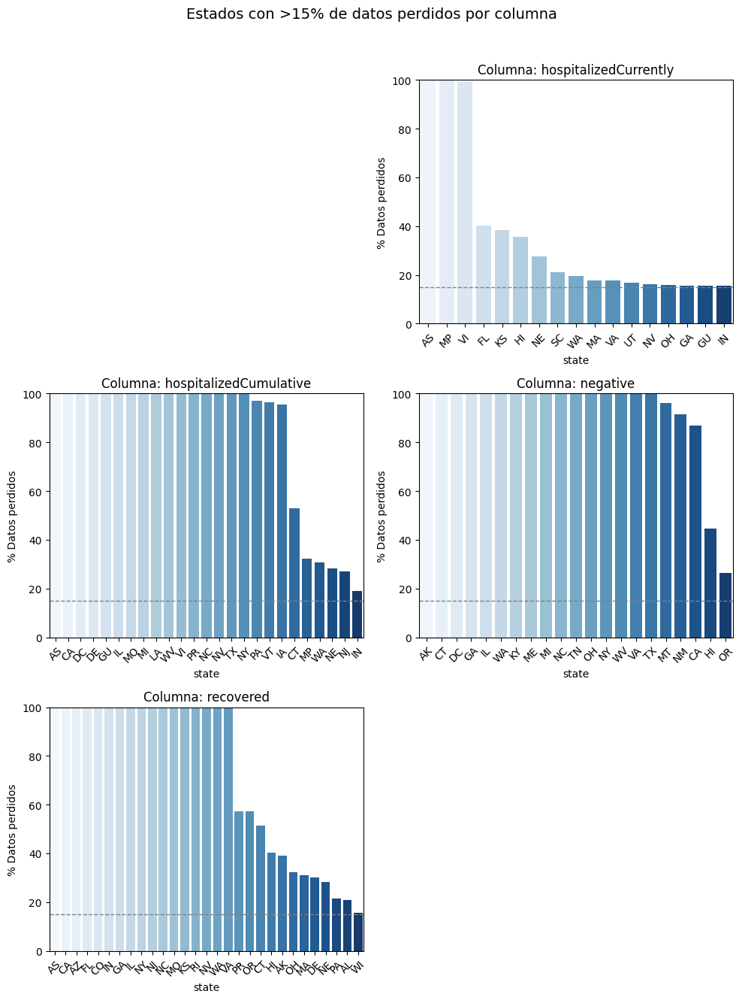

In [28]:
# Configuración general
columns_of_interest = ['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']


# Crear figura con subplots
fig, axes = plt.subplots(3, 2, figsize=(10, 13))
fig.suptitle('Estados con >15% de datos perdidos por columna', y=1.02, fontsize=14)

# Aplanar los ejes para facilitar el acceso
axes = axes.flatten()

for i, col in enumerate(columns_of_interest):
    # Filtrar estados con >15% NA en la columna actual
    filtered_data = perc_na[perc_na[col] > 15][[col]].sort_values(by=col, ascending=False)

    # Crear gráfico solo si hay datos
    if not filtered_data.empty:
        sns.barplot(x=filtered_data.index, y=filtered_data[col], ax=axes[i], palette='Blues')
        axes[i].set_title(f'Columna: {col}')
        axes[i].set_ylabel('% Datos perdidos')
        axes[i].set_ylim(0, 100)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].axhline(15, color='grey', linestyle='--', linewidth=1)  # Línea de referencia
    else:
        axes[i].set_visible(False)  # Ocultar subplot si no hay datos

# Eliminar el último subplot vacío (si hay 5 columnas en 3x2 grid)
axes[-1].set_visible(False)

plt.tight_layout()
plt.show()

In [12]:
subset['death'] = subset['death'].fillna(subset['death'].median()) # el unico campo con menos de 15% datos faltantes

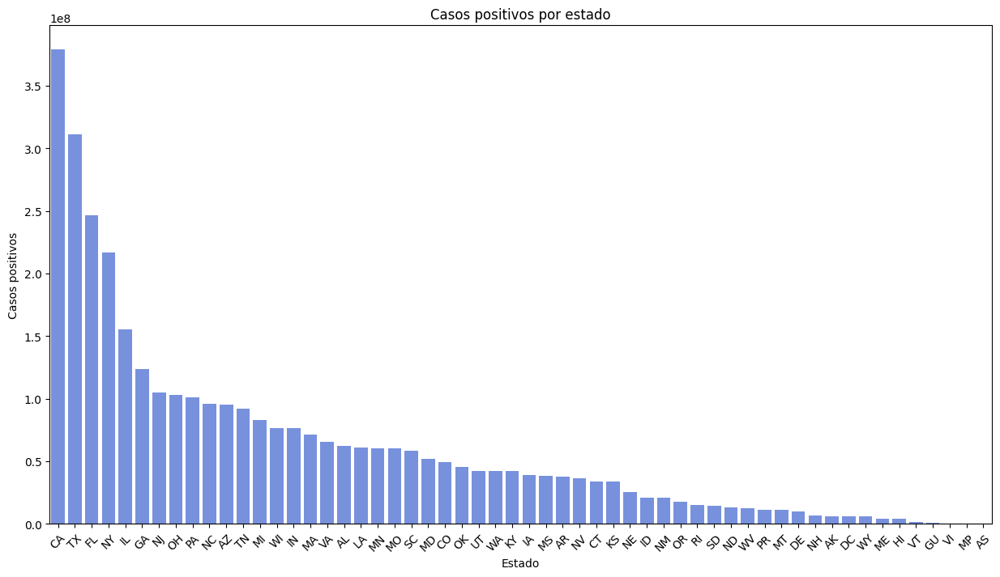

In [29]:
# Agrupamos por estado y sumamos los casos positivos
pos_state = subset.groupby('state').agg({
    'positive': 'sum'
}).reset_index()

# Gráfico de barras para mostrar los casos positivos acumulados por estado usando Seaborn y Matplotlib
plt.figure(figsize=(15, 8))
sns.set_palette('coolwarm')

# Ordenamos los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positive', ascending=False)

# Creamos el gráfico de barras
sns.barplot(x='state', y='positive', data=pos_state_sorted, order=pos_state_sorted['state'])

plt.title('Casos positivos por estado')
plt.xlabel('Estado')
plt.ylabel('Casos positivos')
plt.xticks(rotation=45)
plt.show()

In [14]:
# Paso 1: Calcular el total de casos positivos
total_positivos = pos_state['positive'].sum()

# Paso 2: Ordenar los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positive', ascending=False)

# Paso 3: Crear una nueva columna para el porcentaje acumulado de casos positivos
pos_state_sorted['cumulative_percentage'] = pos_state_sorted['positive'].cumsum() / total_positivos * 100

# Paso 4: Filtrar los estados que suman hasta el 80% de los casos positivos
states_80_percent = pos_state_sorted[pos_state_sorted['cumulative_percentage'] <= 80]

# Mostrar los estados que contribuyen al 80% de los casos positivos
print(states_80_percent)

   state     positive  cumulative_percentage
5     CA  379100459.0              11.147090
47    TX  311242452.0              20.298879
10    FL  246537443.0              27.548079
37    NY  216883639.0              33.925337
16    IL  155523687.0              38.498364
11    GA  123499113.0              42.129739
34    NJ  105084623.0              45.219652
38    OH  103133347.0              48.252191
41    PA  101072365.0              51.224128
30    NC   95648366.0              54.036578
4     AZ   95464371.0              56.843617
46    TN   92154114.0              59.553321
24    MI   82832274.0              61.988926
53    WI   76813945.0              64.247567
17    IN   76263758.0              66.490031
21    MA   71309732.0              68.586826
49    VA   65585628.0              70.515309
1     AL   62062326.0              72.340193
20    LA   61057115.0              74.135520
25    MN   60388446.0              75.911185
26    MO   60088249.0              77.678023
44    SC  

In [53]:
# Agrupamos por estado y sumamos las muertes y casos positivos
mortality_state = subset.groupby('state').agg({
    'positive': 'sum',
    'death': 'sum',
    'hospitalizedCurrently': 'sum'
}).reset_index()

# Calculamos el ratio de mortalidad por estado
mortality_state['mortality_rate'] = (mortality_state['death'] / mortality_state['positive']) * 100
perc_na.reset_index(drop=True, inplace=True)
mortality_state.reset_index(drop=True, inplace=True)
mortality_state['hospit_na_perc'] = perc_na['hospitalizedCurrently']
mortality_state['hospitCum_na_perc'] = perc_na['hospitalizedCumulative']



# Mostrar el ratio de mortalidad por estado
print(mortality_state.sort_values(by='mortality_rate', ascending=False))


   state     positive      death  hospitalizedCurrently  mortality_rate  \
3     AS          0.0     2216.0                    0.0             inf   
27    MP      24253.0     2893.0                    0.0       11.928421   
50    VI     373857.0    27260.0                    9.0        7.291558   
34    NJ  105084623.0  5352148.0               811696.0        5.093179   
7     CT   33618419.0  1605718.0               214270.0        4.776304   
21    MA   71309732.0  3257705.0               443931.0        4.568388   
37    NY  216883639.0  8868871.0              1614237.0        4.089230   
8     DC    6050063.0   222579.0                58996.0        3.678953   
24    MI   82832274.0  2902034.0               533298.0        3.503506   
51    VT    1361136.0    47054.0                 7555.0        3.456965   
41    PA  101072365.0  3400759.0               714330.0        3.364677   
43    RI   14950160.0   439151.0                70256.0        2.937433   
20    LA   61057115.0  17

In [56]:
import pandas as pd

# Crear el DataFrame con los datos proporcionados
data = {
    'state': ['AS', 'MP', 'VI'],
    'positive': [0.0, 24253.0, 373857.0],
    'death': [2216.0, 2893.0, 27260.0],
    'hospitalizedCurrently': [0.0, 0.0, 9.0],
}

df = pd.DataFrame(data)

# Calcular la correlación entre 'death' y 'hospitalizedCurrently'
correlation = df['death'].corr(df['hospitalizedCurrently'])

print(f'Coeficiente de correlación entre "death" y "hospitalizedCurrently": {correlation}')



Coeficiente de correlación entre "death" y "hospitalizedCurrently": 0.9997185262392407


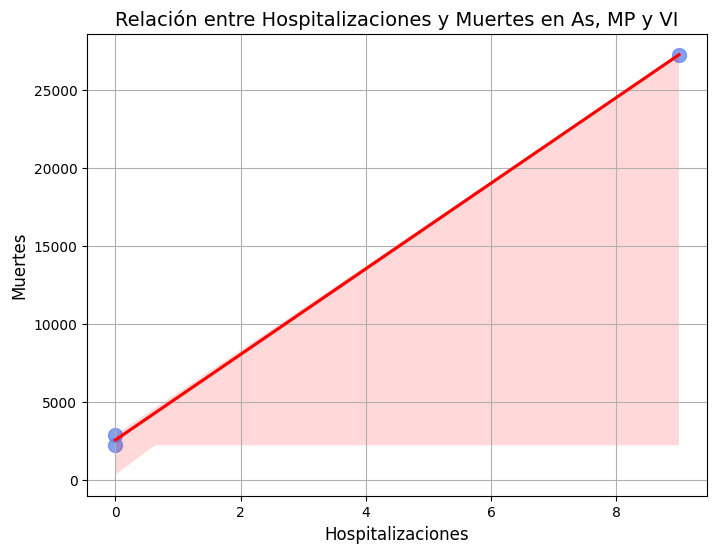

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crear el gráfico de dispersión con una línea de tendencia
plt.figure(figsize=(8, 6))
sns.regplot(x='hospitalizedCurrently', y='death', data=df, scatter_kws={'s': 100}, line_kws={"color": "red"})

# Etiquetas y título
plt.title('Relación entre Hospitalizaciones y Muertes en As, MP y VI', fontsize=14)
plt.xlabel('Hospitalizaciones', fontsize=12)
plt.ylabel('Muertes', fontsize=12)
plt.grid(True)

# Mostrar gráfico
plt.show()
